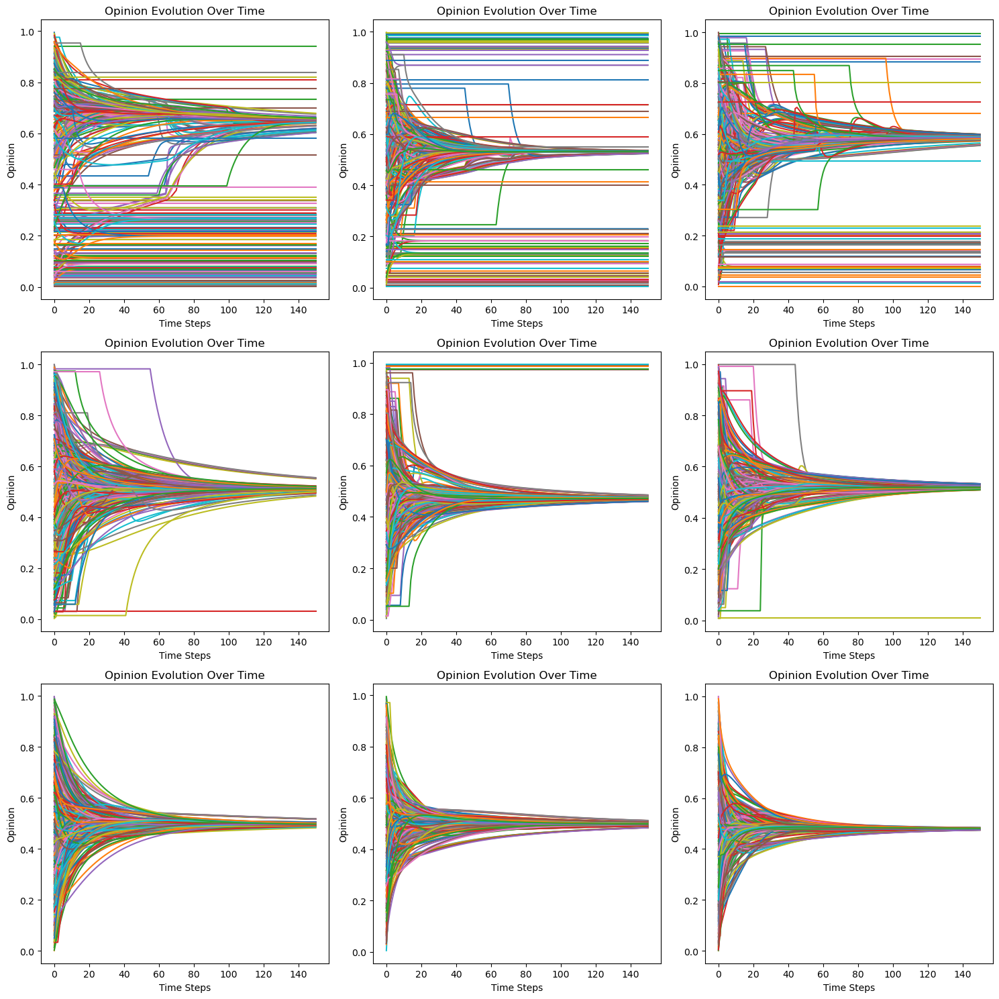

In [17]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def initialize_opinions(num_agents):
    return np.random.rand(num_agents)

def update_opinions(opinions, similarity_threshold, delta, graph):
    for edge in graph.edges():
        agent1, agent2 = edge
        idx1, idx2 = list(graph.nodes()).index(agent1), list(graph.nodes()).index(agent2)
        if abs(opinions[idx1] - opinions[idx2]) <= similarity_threshold:
            opinions[idx1] += delta * (opinions[idx2] - opinions[idx1])
            opinions[idx2] += delta * (opinions[idx1] - opinions[idx2])

    return opinions

def simulate_opinion_dynamics(graph, num_steps, similarity_threshold, delta):
    num_agents = len(graph.nodes())
    opinions = initialize_opinions(num_agents)
    opinion_history = [opinions.copy()]

    for step in range(num_steps):
        opinions = update_opinions(opinions, similarity_threshold, delta, graph)
        opinion_history.append(opinions.copy())

    return opinion_history

def plot_opinion_evolution_subplot(opinion_history, ax):
    num_steps = len(opinion_history) - 1
    num_agents = len(opinion_history[0])

    for agent in range(num_agents):
        agent_opinions = [history[agent] for history in opinion_history]
        ax.plot(range(num_steps + 1), agent_opinions, label=f'Agent {agent + 1}')

    ax.set_xlabel('Time Steps')
    ax.set_ylabel('Opinion')
    ax.set_title('Opinion Evolution Over Time')
    # ax.legend()

# graph = nx.read_graphml("practice/trump-network.graphml")
graph = nx.read_graphml("practice/got-network.graphml")

fig, axs = plt.subplots(3, 3, figsize=(15, 15))

for i, similarity_threshold in enumerate([0.3, 0.5, 0.7]):
    for j, delta in enumerate([0.1, 0.3, 0.5]):
        num_steps = 150

        opinion_history = simulate_opinion_dynamics(graph, num_steps, similarity_threshold, delta)
        plot_opinion_evolution_subplot(opinion_history, axs[i, j])

plt.tight_layout()
plt.savefig('got.png')
# plt.savefig('trump.png')
plt.show()

MovieWriter imagemagick unavailable; using Pillow instead.


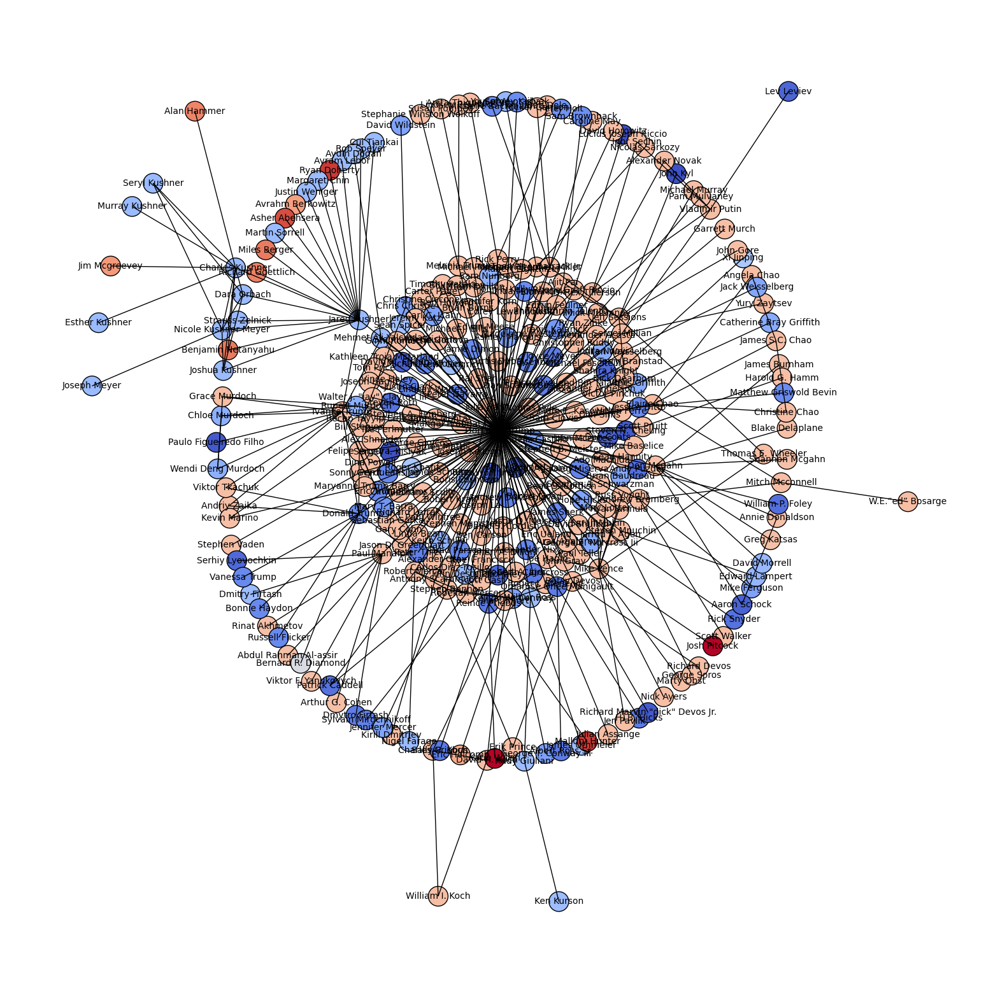

MovieWriter imagemagick unavailable; using Pillow instead.


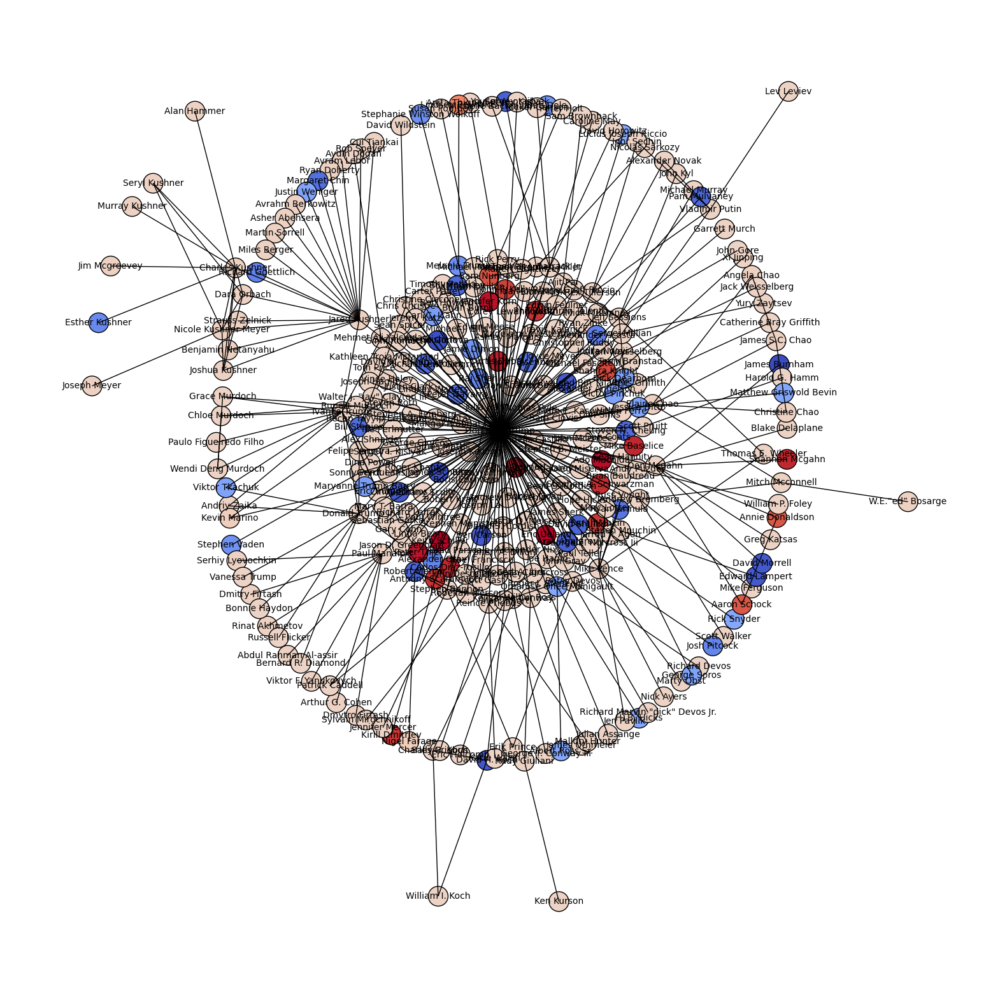

MovieWriter imagemagick unavailable; using Pillow instead.


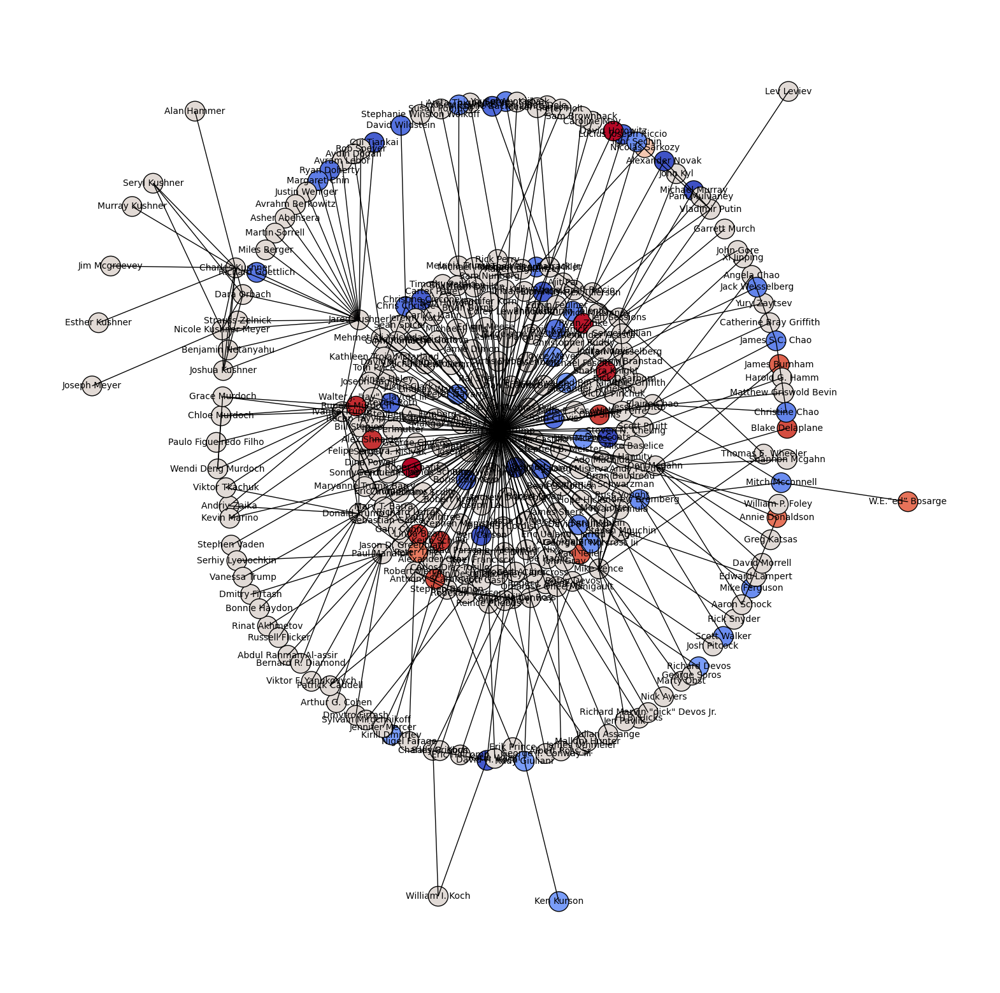

MovieWriter imagemagick unavailable; using Pillow instead.


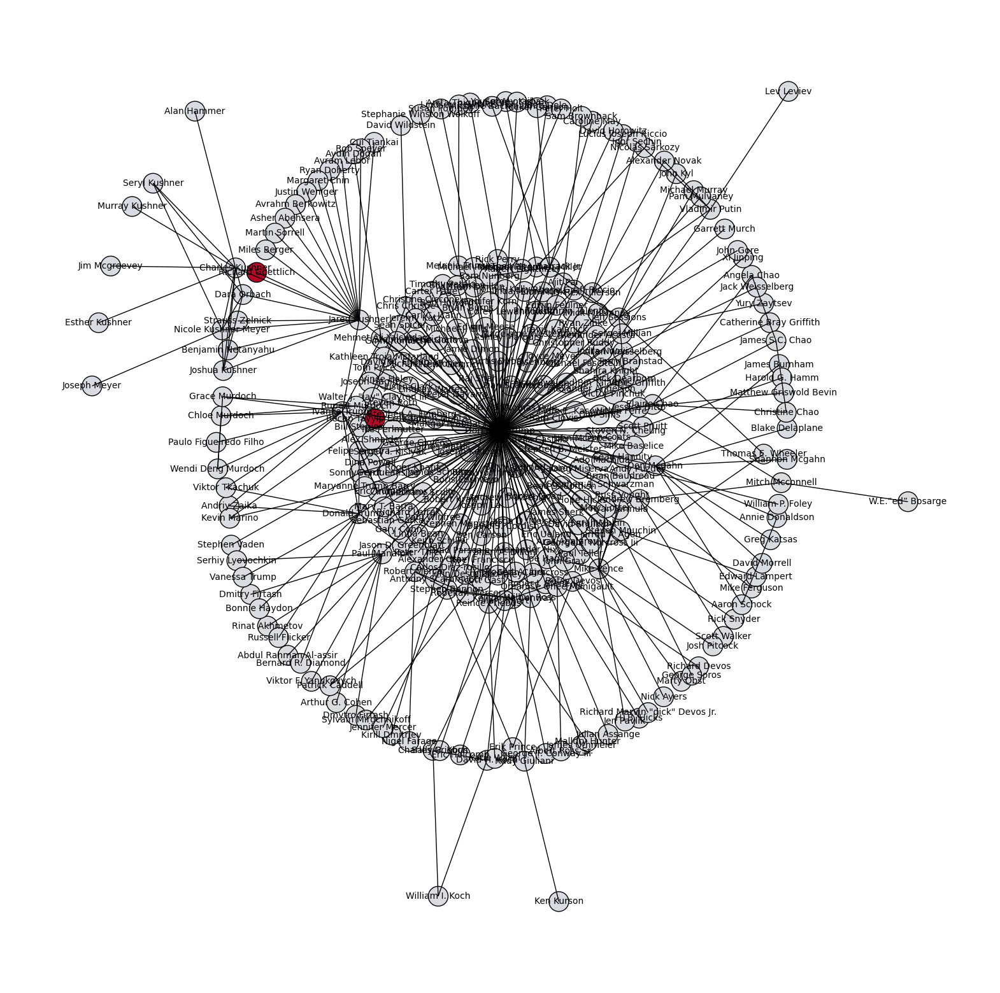

MovieWriter imagemagick unavailable; using Pillow instead.


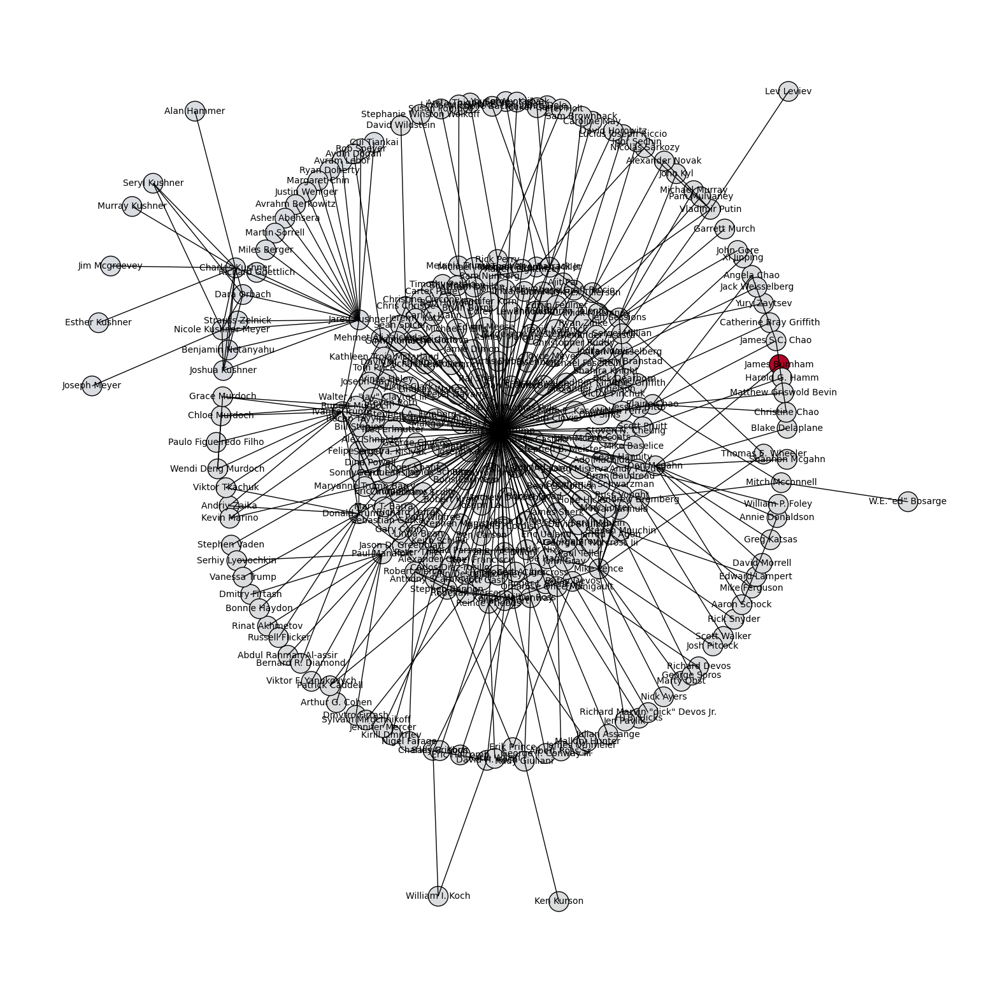

MovieWriter imagemagick unavailable; using Pillow instead.


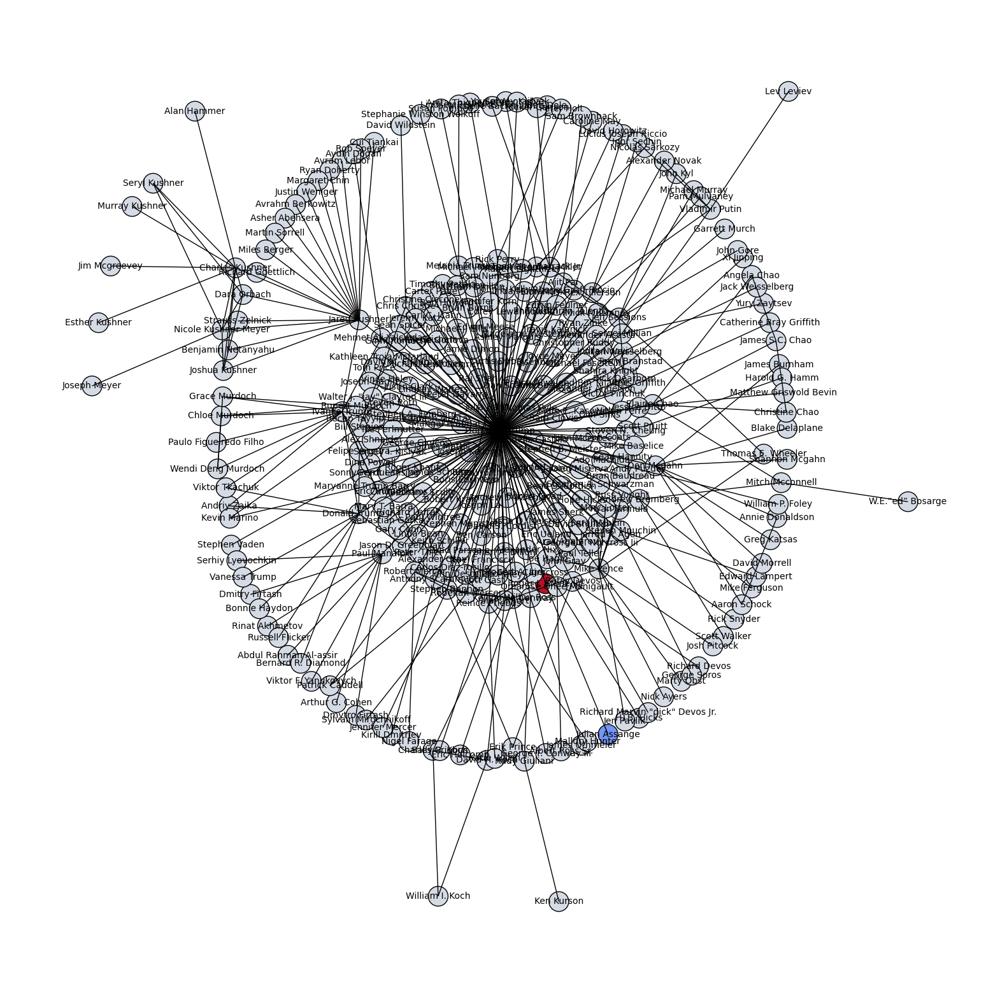

MovieWriter imagemagick unavailable; using Pillow instead.


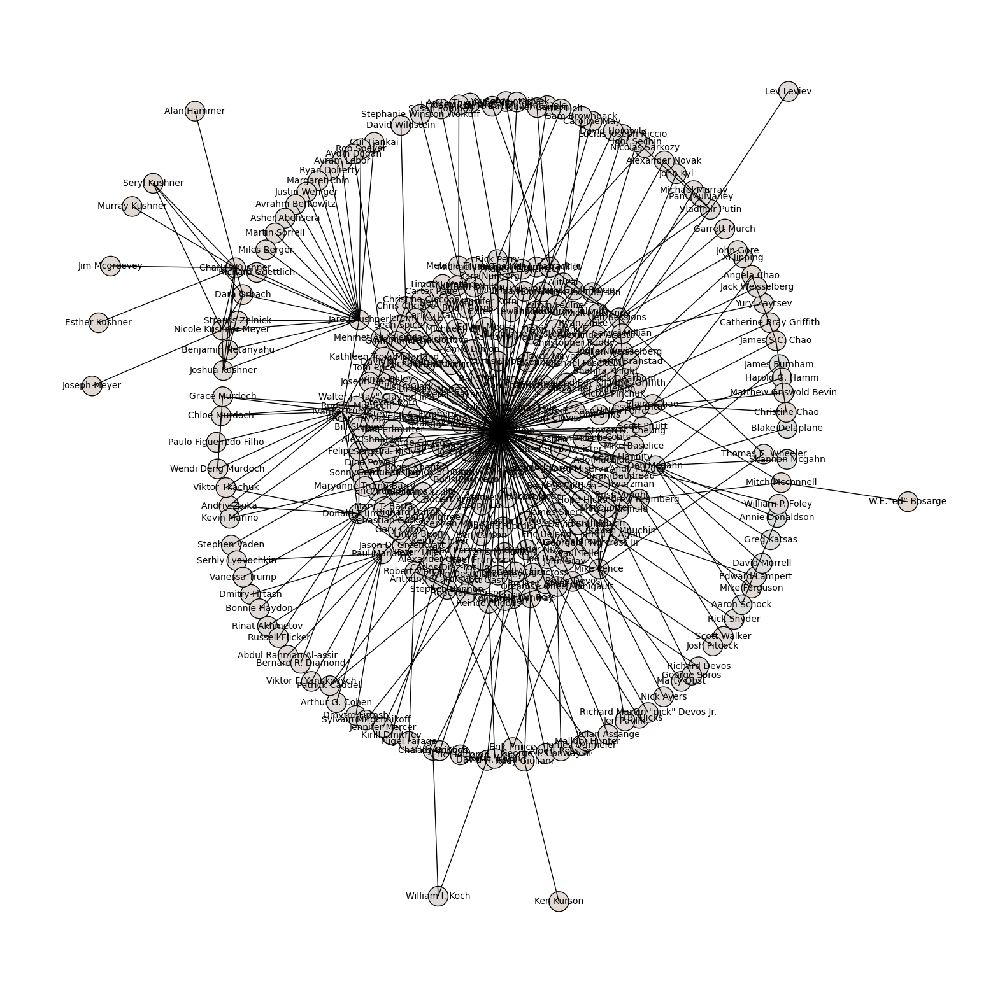

MovieWriter imagemagick unavailable; using Pillow instead.


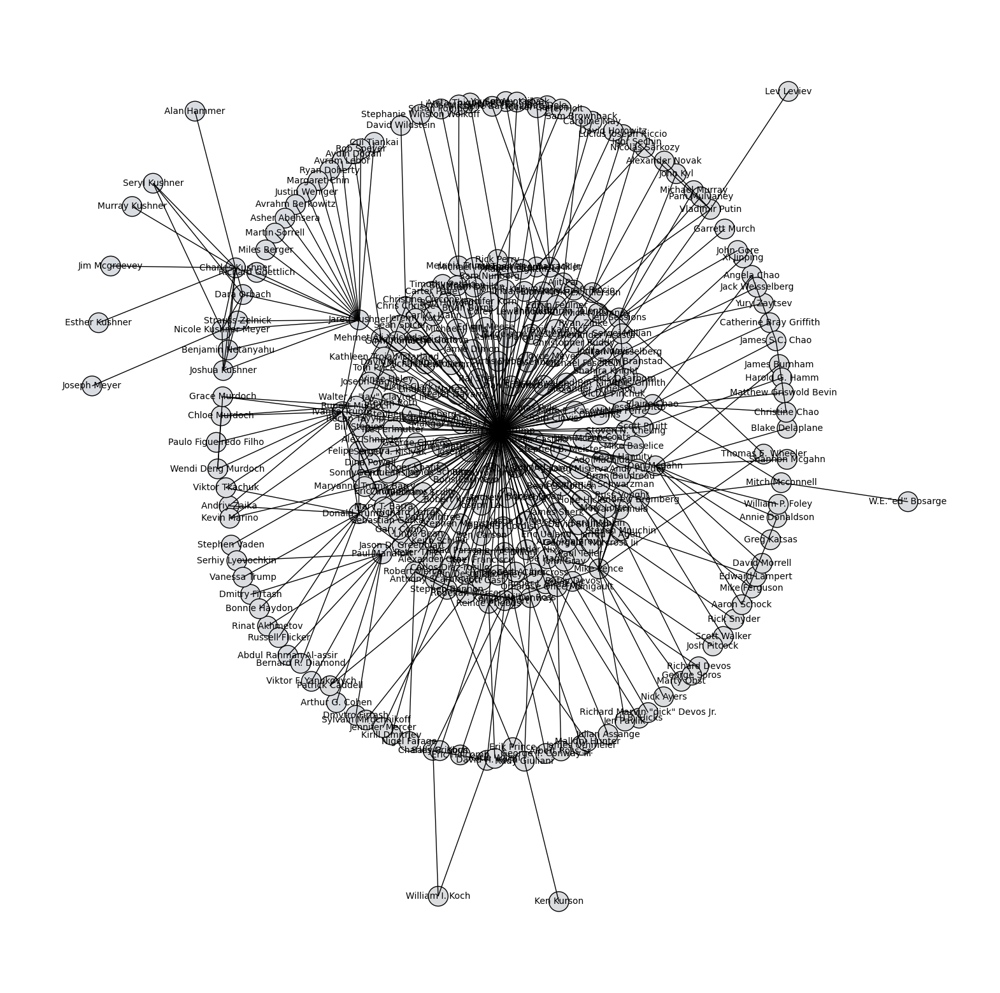

MovieWriter imagemagick unavailable; using Pillow instead.


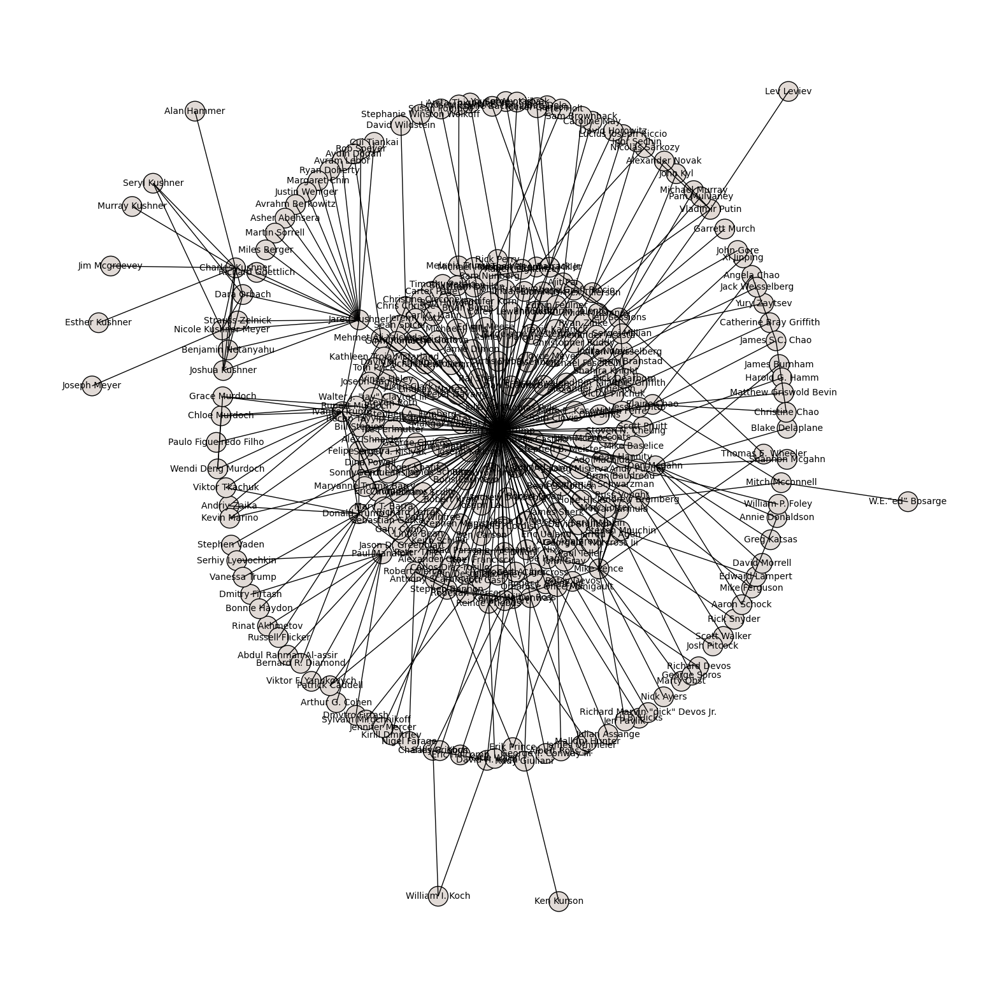

In [19]:
def animate_nodes_opinions(graph, opinion_history, pos=None, *args, **kwargs):
    if pos is None:
        pos = nx.kamada_kawai_layout(graph) 

    def update(frame):
        current_opinions = opinion_history[frame]
        scatter.set_array(np.array(current_opinions))
        return scatter,

    fig, ax = plt.subplots(figsize=(20, 20)) 
    ax.set_axis_off()

    labels = nx.draw_networkx_labels(graph, pos, font_size=10, font_color='black') 
    scatter = ax.scatter(*zip(*pos.values()), c=opinion_history[0], cmap='coolwarm', s=500, edgecolors='k', linewidths=1)  
    nodes = scatter.get_array()

    edges = nx.draw_networkx_edges(graph, pos, *args, **kwargs)

    fig = plt.gcf()
    animation = FuncAnimation(fig, update, interval=50, frames=len(opinion_history), blit=True)
    return animation

for similarity_threshold in [0.3, 0.5, 0.7]:
    for delta in [0.1, 0.3, 0.5]:
        num_steps = 200
        opinion_history = simulate_opinion_dynamics(graph, num_steps, similarity_threshold, delta)
        animation = animate_nodes_opinions(graph, opinion_history)
        filename = f'tr_opinion_evolution_threshold_{similarity_threshold}_delta_{delta}.gif'
        animation.save(filename, writer='imagemagick', savefig_kwargs={'facecolor':'white'}, fps=5)
        plt.show()

In [18]:
nodes = len(graph.nodes())
edges = len(graph.edges())
avg_degree = np.mean(list(dict(graph.degree()).values()))
clustering_coefficient = nx.average_clustering(graph)

nodes, edges, avg_degree, clustering_coefficient

(303, 366, 2.4158415841584158, 0.15460456268852035)